# Hotel Booking Cancellation Prediction

## 1. Latar Belakang
Di industri perhotelan yang sangat kompetitif, pembatalan reservasi menjadi tantangan besar dalam mengelola pendapatan dan operasional. Hotel sering kali mengalami ketidakpastian dalam peramalan hunian kamar akibat pembatalan mendadak yang dapat mengakibatkan hilangnya pendapatan dan inefisiensi operasional. Ketika reservasi dibatalkan, terutama pada saat-saat terakhir, hotel menghadapi kesulitan untuk mengisi kembali kamar yang kosong, sehingga memengaruhi tingkat okupansi dan pendapatan secara keseluruhan. Selain itu, ketidakpastian dalam tingkat hunian juga berdampak pada perencanaan staf dan sumber daya, yang dapat menyebabkan biaya operasional yang tidak efisien.

Untuk mengatasi masalah ini, hotel memerlukan kemampuan untuk memprediksi kemungkinan pembatalan reservasi dengan akurat. Dengan adanya model prediktif yang efektif, hotel dapat mengoptimalkan strategi overbooking, menyesuaikan harga kamar secara dinamis, dan merencanakan kebutuhan operasional dengan lebih baik. Model ini dapat mempertimbangkan berbagai faktor seperti segmen pasar, tipe pelanggan, jenis deposit, riwayat pembatalan, dan permintaan khusus pelanggan untuk menghasilkan prediksi yang lebih akurat.

Implementasi solusi ini tidak hanya membantu hotel dalam meminimalkan dampak negatif dari pembatalan reservasi, tetapi juga meningkatkan efisiensi operasional dan kepuasan pelanggan. Dengan strategi yang lebih proaktif dalam mengelola inventaris kamar dan menentukan harga secara optimal, hotel dapat mempertahankan daya saingnya di pasar yang kompetitif.

---

## 2. Stakeholders and Their Needs
- **Manajer Pendapatan Hotel (Revenue Managers):** 
  - **Kebutuhan:** Prediksi pembatalan reservasi untuk mengoptimalkan strategi overbooking dan penetapan harga guna memaksimalkan pendapatan.
  - **Manfaat:** Membantu dalam perencanaan penjualan kamar dan strategi pendapatan yang lebih efektif.
# 
- **Tim Operasional:** 
  - **Kebutuhan:** Informasi yang akurat tentang tingkat hunian untuk perencanaan staf dan pengalokasian sumber daya yang efisien.
  - **Manfaat:** Meningkatkan efisiensi operasional dan mengurangi biaya yang tidak perlu.

- **Tim Pemasaran:** 
  - **Kebutuhan:** Memahami pola pembatalan untuk menyusun kampanye pemasaran yang tepat sasaran dan meningkatkan retensi pelanggan.
  - **Manfaat:** Mengurangi tingkat pembatalan dengan strategi pemasaran yang lebih efektif dan personalisasi penawaran.

- **Pelanggan (Tamu Hotel):**
  - **Kebutuhan:** Kepastian akan ketersediaan kamar dan pengalaman pemesanan yang andal.
  - **Manfaat:** Meningkatkan kepuasan dan loyalitas pelanggan dengan mengurangi overbooking dan memastikan ketersediaan kamar.

---
# 
## 3. Permasalahan yang Dihadapi
Pembatalan reservasi hotel menyebabkan gangguan pada prediksi pendapatan, pengelolaan inventaris kamar, dan perencanaan operasional, yang mengakibatkan:
- **Kehilangan Pendapatan:** Pembatalan reservasi mengakibatkan hilangnya peluang pendapatan, terutama jika kamar tidak terisi kembali.
- **Inefisiensi Operasional:** Kekurangan atau kelebihan staf akibat prediksi tingkat hunian yang tidak akurat.
- **Ketidakpuasan Pelanggan:** Ketidakmampuan untuk memenuhi permintaan kamar akibat pembatalan mendadak atau no-show.
# 
---
# 
## 4. Pentingnya Penyelesaian Masalah
- **Optimasi Pendapatan:** Prediksi pembatalan memungkinkan hotel untuk menerapkan strategi overbooking dan mengoptimalkan harga kamar, sehingga pendapatan dapat lebih dimaksimalkan.
- **Efisiensi Operasional:** Peramalan yang akurat memungkinkan perencanaan staf dan inventaris yang lebih baik, sehingga mengurangi biaya operasional.
- **Peningkatan Kepuasan Pelanggan:** Dengan meminimalkan overbooking atau kekurangan kamar mendadak, kepuasan dan loyalitas pelanggan dapat meningkat.
# 
---
# 
## 5. Tujuan dan Target
Tujuan dari proyek ini adalah membangun model machine learning untuk memprediksi pembatalan reservasi hotel secara akurat, sehingga hotel dapat:
- **Meminimalkan Kehilangan Pendapatan:** Dengan menerapkan strategi overbooking berdasarkan prediksi pembatalan.
- **Mengoptimalkan Efisiensi Operasional:** Melalui prediksi permintaan dan pengalokasian sumber daya yang akurat.
- **Meningkatkan Kepuasan Pelanggan:** Dengan mengurangi skenario overbooking dan memastikan ketersediaan kamar.
# 
---

## Data Understanding, Data Cleaning & EDA

### Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from IPython.display import display, Markdown
import plotly.express as px
import plotly.subplots as sp
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import sklearn.neighbors as knn
from sklearn.metrics import confusion_matrix
import shap
import pickle


c:\Users\Evelio\anaconda3\envs\jcds_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df=pd.read_csv('data_hotel_booking_demand.csv')
df.head()

,country,market_segment,previous_cancellations,booking_changes,deposit_type,days_in_waiting_list,customer_type,reserved_room_type,required_car_parking_spaces,total_of_special_requests,is_canceled
0,IRL,Offline TA/TO,0,0,No Deposit,0,Transient-Party,A,0,0,0
1,FRA,Online TA,0,0,No Deposit,0,Transient,A,0,2,0
2,PRT,Online TA,0,1,No Deposit,0,Transient,A,0,2,0
3,NLD,Online TA,0,0,No Deposit,0,Transient,A,0,1,1
4,PRT,Online TA,0,2,No Deposit,0,Transient,A,0,2,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83573 entries, 0 to 83572
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   country                      83222 non-null  object
 1   market_segment               83573 non-null  object
 2   previous_cancellations       83573 non-null  int64 
 3   booking_changes              83573 non-null  int64 
 4   deposit_type                 83573 non-null  object
 5   days_in_waiting_list         83573 non-null  int64 
 6   customer_type                83573 non-null  object
 7   reserved_room_type           83573 non-null  object
 8   required_car_parking_spaces  83573 non-null  int64 
 9   total_of_special_requests    83573 non-null  int64 
 10  is_canceled                  83573 non-null  int64 
dtypes: int64(6), object(5)
memory usage: 7.0+ MB


Dataset ini berisi informasi pemesanan untuk sebuah hotel yang berlokasi di Portugal dan mencakup data terkait reservasi kamar untuk masing-masing pelanggan. Semua informasi yang dapat mengidentifikasi pribadi telah dihapus dari data ini.

Dataset ini memiliki 83.573 entri dan 11 kolom. Berikut adalah gambaran singkat mengenai kolom-kolom yang terdapat dalam dataset:

Kolom dan Tipe Data:
- country (object) - Negara asal pelanggan (terdapat nilai kosong: 351)
- market_segment (object) - Segmen pasar dari pelanggan
- previous_cancellations (int64) - Jumlah pembatalan sebelumnya yang pernah dilakukan oleh pelanggan
- booking_changes (int64) - Jumlah perubahan yang dilakukan pada pemesanan setelah - reservasi dilakukan hingga waktu check-in atau pembatalan
- deposit_type (object) - Jenis deposit yang dilakukan untuk menjamin pemesanan
- days_in_waiting_list (int64) - Jumlah hari pemesanan berada di daftar tunggu sebelum dikonfirmasi
- customer_type (object) - Tipe pelanggan berdasarkan jenis pemesanan
- reserved_room_type (object) - Tipe kamar yang dipesan (dikodekan untuk menjaga anonimitas)
- required_car_parking_spaces (int64) - Jumlah tempat parkir mobil yang dibutuhkan oleh pelanggan
- total_of_special_requests (int64) - Jumlah permintaan khusus yang diajukan oleh pelanggan (misalnya: twin bed atau lantai tinggi)
- is_canceled (int64) - Variabel target yang menunjukkan apakah pemesanan dibatalkan (1) atau tidak (0)

In [4]:
df.describe()

,previous_cancellations,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,is_canceled
count,83573.000000,83573.000000,83573.000000,83573.000000,83573.000000,83573.000000
mean,0.086798,0.220897,2.330561,0.062999,0.573211,0.368277
std,0.841011,0.648635,17.673051,0.246919,0.795163,0.482340
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,26.000000,21.000000,391.000000,8.000000,5.000000,1.000000


In [5]:
pd.set_option('display.max_colwidth', 1)

# Unique values in columns
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=[['Column Name', 'Number of Unique', 'Unique Sample']],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,country,162,"[IRL, FRA, PRT, NLD, ESP, UMI, CN, LUX, BRA, BEL, JPN, DEU, ITA, CHE, GBR, AGO, SRB, COL, CHN, SWE, AUT, CIV, CZE, POL, USA, SGP, RUS, ROU, DNK, IND, MAR, PHL, ARG, ISL, ZAF, LBN, MOZ, TUR, BGD, MEX, CAF, NOR, FIN, UKR, EGY, ISR, nan, KOR, AZE, HUN, AUS, EST, CHL, SVN, PRY, ABW, ALB, LTU, ARE, HRV, SAU, NZL, LVA, ATA, KAZ, DZA, TWN, CRI, BIH, BGR, IRQ, OMN, VEN, IDN, GEO, MLT, IRN, BLR, URY, LBY, TUN, BEN, MYS, MWI, GRC, CYP, CPV, HKG, PRI, MKD, MUS, IMN, PAN, NGA, GLP, KHM, PER, QAT, SEN, MAC, ...]"
1,market_segment,8,"[Offline TA/TO, Online TA, Direct, Groups, Corporate, Complementary, Aviation, Undefined]"
2,previous_cancellations,15,"[0, 1, 25, 2, 3, 11, 24, 13, 6, 26, 14, 4, 19, 5, 21]"
3,booking_changes,19,"[0, 1, 2, 5, 3, 4, 6, 7, 9, 8, 17, 10, 13, 12, 14, 21, 16, 20, 15]"
4,deposit_type,3,"[No Deposit, Non Refund, Refundable]"
5,days_in_waiting_list,115,"[0, 3, 39, 87, 77, 215, 97, 162, 46, 79, 4, 31, 122, 34, 57, 259, 50, 17, 32, 43, 75, 69, 44, 22, 113, 58, 38, 65, 48, 236, 176, 25, 108, 91, 19, 160, 68, 28, 63, 35, 42, 59, 24, 8, 183, 187, 21, 111, 56, 98, 101, 15, 16, 47, 93, 45, 14, 70, 10, 49, 178, 99, 60, 40, 85, 223, 6, 33, 391, 20, 1, 41, 147, 55, 80, 379, 150, 61, 330, 174, 107, 96, 18, 62, 13, 30, 120, 27, 207, 71, 2, 76, 125, 5, 9, 224, 53, 83, 84, 12, ...]"
6,customer_type,4,"[Transient-Party, Transient, Contract, Group]"
7,reserved_room_type,10,"[A, E, D, F, B, G, C, H, L, P]"
8,required_car_parking_spaces,5,"[0, 1, 2, 8, 3]"
9,total_of_special_requests,6,"[0, 2, 1, 3, 4, 5]"


### Data Cleaning

In [6]:
# Mengecek jumlah missing values per kolom
missing_values = df.isnull().sum()
print("Missing values per kolom:\n", missing_values)
null_percentage = (df['country'].isnull().sum() / len(df)) * 100
print(f"Persentase nilai null pada kolom 'country': {null_percentage:.2f}%")


Missing values per kolom:
 country                        351
market_segment                 0  
previous_cancellations         0  
booking_changes                0  
deposit_type                   0  
days_in_waiting_list           0  
customer_type                  0  
reserved_room_type             0  
required_car_parking_spaces    0  
total_of_special_requests      0  
is_canceled                    0  
dtype: int64
Persentase nilai null pada kolom 'country': 0.42%


#### Analisis Pilihan untuk mengubah nilai null: Mode vs "Others"

1. Menggunakan Mode (PRT atau negara terbanyak)
    - Pros:
        - Jumlah missing values sangat kecil (hanya 0.42%), jadi pengaruhnya terhadap distribusi data tidak signifikan.
        - Tetap menjaga data tetap natural dan konsisten dengan distribusi asli.
        - Tidak menambah kategori baru yang bisa menyebabkan noise.
    - Cons:
        - Bisa sedikit memperkuat bias ke negara dengan frekuensi tertinggi.

2. Menggunakan "Others"
    - Pros:
        - Tidak membuat asumsi bahwa data yang hilang berasal dari negara mayoritas.
    - Cons:
        - Karena jumlah missing values hanya 0.42%, menambah kategori "Others" bisa dianggap tidak perlu.
        - Model mungkin sulit memahami arti "Others" karena hanya ada 351 contoh, yang bisa berdampak negatif pada prediksi.

Dikarenakan Jumlah null yang sangat kecil maka saya akan menggunakan metode modulus atau mode

In [7]:
df.fillna({'country': df['country'].mode()[0]}, inplace=True)


### Cek Duplikat
Duplikat tidak akan di ubah/dihilangkan karena blablabla

In [8]:
print("Jumlah duplikat:", df.duplicated().sum())

Jumlah duplikat: 73476


In [9]:
pd.set_option('display.max_colwidth', 1)

# Unique values in columns
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=[['Column Name', 'Number of Unique', 'Unique Sample']],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,country,162,"[IRL, FRA, PRT, NLD, ESP, UMI, CN, LUX, BRA, BEL, JPN, DEU, ITA, CHE, GBR, AGO, SRB, COL, CHN, SWE, AUT, CIV, CZE, POL, USA, SGP, RUS, ROU, DNK, IND, MAR, PHL, ARG, ISL, ZAF, LBN, MOZ, TUR, BGD, MEX, CAF, NOR, FIN, UKR, EGY, ISR, KOR, AZE, HUN, AUS, EST, CHL, SVN, PRY, ABW, ALB, LTU, ARE, HRV, SAU, NZL, LVA, ATA, KAZ, DZA, TWN, CRI, BIH, BGR, IRQ, OMN, VEN, IDN, GEO, MLT, IRN, BLR, URY, LBY, TUN, BEN, MYS, MWI, GRC, CYP, CPV, HKG, PRI, MKD, MUS, IMN, PAN, NGA, GLP, KHM, PER, QAT, SEN, MAC, SVK, ...]"
1,market_segment,8,"[Offline TA/TO, Online TA, Direct, Groups, Corporate, Complementary, Aviation, Undefined]"
2,previous_cancellations,15,"[0, 1, 25, 2, 3, 11, 24, 13, 6, 26, 14, 4, 19, 5, 21]"
3,booking_changes,19,"[0, 1, 2, 5, 3, 4, 6, 7, 9, 8, 17, 10, 13, 12, 14, 21, 16, 20, 15]"
4,deposit_type,3,"[No Deposit, Non Refund, Refundable]"
5,days_in_waiting_list,115,"[0, 3, 39, 87, 77, 215, 97, 162, 46, 79, 4, 31, 122, 34, 57, 259, 50, 17, 32, 43, 75, 69, 44, 22, 113, 58, 38, 65, 48, 236, 176, 25, 108, 91, 19, 160, 68, 28, 63, 35, 42, 59, 24, 8, 183, 187, 21, 111, 56, 98, 101, 15, 16, 47, 93, 45, 14, 70, 10, 49, 178, 99, 60, 40, 85, 223, 6, 33, 391, 20, 1, 41, 147, 55, 80, 379, 150, 61, 330, 174, 107, 96, 18, 62, 13, 30, 120, 27, 207, 71, 2, 76, 125, 5, 9, 224, 53, 83, 84, 12, ...]"
6,customer_type,4,"[Transient-Party, Transient, Contract, Group]"
7,reserved_room_type,10,"[A, E, D, F, B, G, C, H, L, P]"
8,required_car_parking_spaces,5,"[0, 1, 2, 8, 3]"
9,total_of_special_requests,6,"[0, 2, 1, 3, 4, 5]"


#### Top 10 Countries by Number of Bookings

In [10]:
top10_country = df['country'].value_counts().head(10).reset_index()
top10_country.columns = ['Country', 'Number of Bookings']

fig = px.bar(top10_country, x='Number of Bookings', y='Country', orientation='h', 
             title='Top 10 Countries by Number of Bookings', 
             labels={'Number of Bookings': 'Number of Bookings', 'Country': 'Country'},
             color='Number of Bookings', color_continuous_scale='viridis')

fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Grafik di atas menunjukkan Top 10 Negara Berdasarkan Jumlah Pemesanan di hotel yang berlokasi di Portugal. Berikut adalah beberapa poin penting yang dapat diambil dari grafik ini:

Observasi:
1. Portugal (PRT) memiliki jumlah pemesanan tertinggi dibandingkan dengan negara-negara lainnya, dengan selisih yang sangat signifikan. Hal ini dapat disebabkan oleh faktor geografis dan preferensi pelanggan lokal yang lebih cenderung melakukan staycation atau perjalanan domestik.
2. Inggris (GBR) dan Perancis (FRA) menempati urutan kedua dan ketiga dalam jumlah pemesanan. Ini menunjukkan bahwa turis dari Eropa Barat merupakan salah satu pasar utama bagi hotel di Portugal.
3. Spanyol (ESP) dan Jerman (DEU) juga berada di peringkat atas, yang bisa dihubungkan dengan kedekatan geografis dan kemudahan akses perjalanan antar negara di Eropa.
4. Negara-negara lain seperti Italia (ITA), Irlandia (IRL), Belgia (BEL), Brasil (BRA), dan Amerika Serikat (USA) menyumbang jumlah pemesanan yang lebih rendah, namun tetap termasuk dalam 10 besar.

#### Insight Bisnis:
Pihak hotel dapat fokus pada strategi pemasaran lokal untuk memaksimalkan pendapatan, mengingat tingginya permintaan dari pelanggan domestik.
Hotel juga bisa mempertimbangkan promosi khusus untuk pelanggan dari Inggris, Prancis, dan Spanyol yang memiliki kontribusi besar dalam pemesanan internasional.
Untuk meningkatkan penetrasi pasar, strategi pemasaran yang lebih efektif dapat ditargetkan ke negara-negara di peringkat bawah seperti BRA dan USA.

### Mengubah kolom country menjadi Portugal dan Non-Portugal

In [11]:
df["country"] = df["country"].apply(lambda x: "Portugal" if x == "PRT" else "Non-Portugal")
print(df['country'].value_counts())
# plot country
fig = px.pie(df, names='country', title='Country Distribution', 
             labels={'country': 'Country'}, 
             color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

country
Non-Portugal    49125
Portugal        34448
Name: count, dtype: int64


Grafik di atas menunjukkan Distribusi Negara Asal Pelanggan yang melakukan pemesanan di hotel yang berlokasi di Portugal. Setelah mengelompokkan kolom country menjadi dua kategori, yaitu Portugal dan Non-Portugal.

### Insight Bisnis:
- Dengan hampir 60% pemesanan berasal dari luar negeri, strategi pemasaran internasional menjadi sangat penting untuk mempertahankan dan meningkatkan jumlah wisatawan asing. Hotel dapat menargetkan kampanye pemasaran ke negara-negara dengan pemesanan terbanyak di grafik sebelumnya, seperti Inggris, Prancis, dan Spanyol.
- 41.2% pemesanan dari Portugal menunjukkan potensi pasar domestik yang kuat. Hotel dapat memanfaatkan ini dengan menawarkan paket promosi khusus untuk warga lokal, seperti promo akhir pekan atau staycation.
- Mengingat distribusi yang cukup seimbang antara tamu lokal dan internasional, hotel dapat mengoptimalkan layanan dan fasilitas untuk memenuhi kebutuhan kedua segmen ini, seperti menyediakan menu multi-bahasa dan paket wisata lokal.

#### Distribusi "is_canceled"

In [12]:
df['is_canceled'].value_counts()

fig = px.pie(df, names='is_canceled', title='Persentase Canceled dan Not Canceled', 
             labels={'is_canceled': 'Cancellation Status'}, 
             color_discrete_map={0: 'blue', 1: 'red'},
             hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


Grafik di atas menunjukkan Persentase Canceled dan Not Canceled pada variabel target is_canceled, yang menunjukkan status pemesanan di hotel:

### Insight Bisnis:
- Dengan 36.8% pemesanan yang dibatalkan, hotel menghadapi potensi kehilangan pendapatan yang cukup besar. Ini menunjukkan bahwa ada peluang untuk mengoptimalkan strategi overbooking atau kebijakan pembatalan untuk meminimalkan dampak finansial.
- 63.2% pemesanan yang terealisasi menunjukkan bahwa mayoritas pelanggan tetap datang sesuai reservasi. Hotel dapat fokus pada strategi loyalitas untuk mempertahankan tingkat kedatangan yang tinggi.
- Tingkat pembatalan yang cukup tinggi (36.8%) juga menunjukkan pentingnya model prediktif untuk mengidentifikasi kemungkinan pembatalan, sehingga hotel dapat mengambil langkah preventif seperti menghubungi pelanggan atau menawarkan insentif agar tidak membatalkan pemesanan.

#### Plot data distribution for numerical features

In [13]:
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_features.remove('is_canceled')

fig = sp.make_subplots(rows=3, cols=3, subplot_titles=numerical_features)

for i, feature in enumerate(numerical_features):
    row = i // 3 + 1
    col = i % 3 + 1
    fig.add_trace(px.histogram(df, x=feature).data[0], row=row, col=col)

fig.update_layout(height=800, width=1200, title_text="Distribution of Numerical Features", bargap=0.2)
fig.show()

#### Data Distribution for Categorical Features

In [14]:
categorical_features = df.select_dtypes(include=['object']).columns.tolist()
categorical_features.remove('country')
import plotly.express as px
import plotly.subplots as sp

fig = sp.make_subplots(rows=2, cols=2, subplot_titles=categorical_features)

for i, col in enumerate(categorical_features):
    row = i // 2 + 1
    col_num = i % 2 + 1
    fig.add_trace(px.histogram(df, x=col).data[0], row=row, col=col_num)

fig.update_layout(height=800, width=1200, title_text="Distribution of Categorical Features")
fig.show()

#### Feature Correlation Heatmap

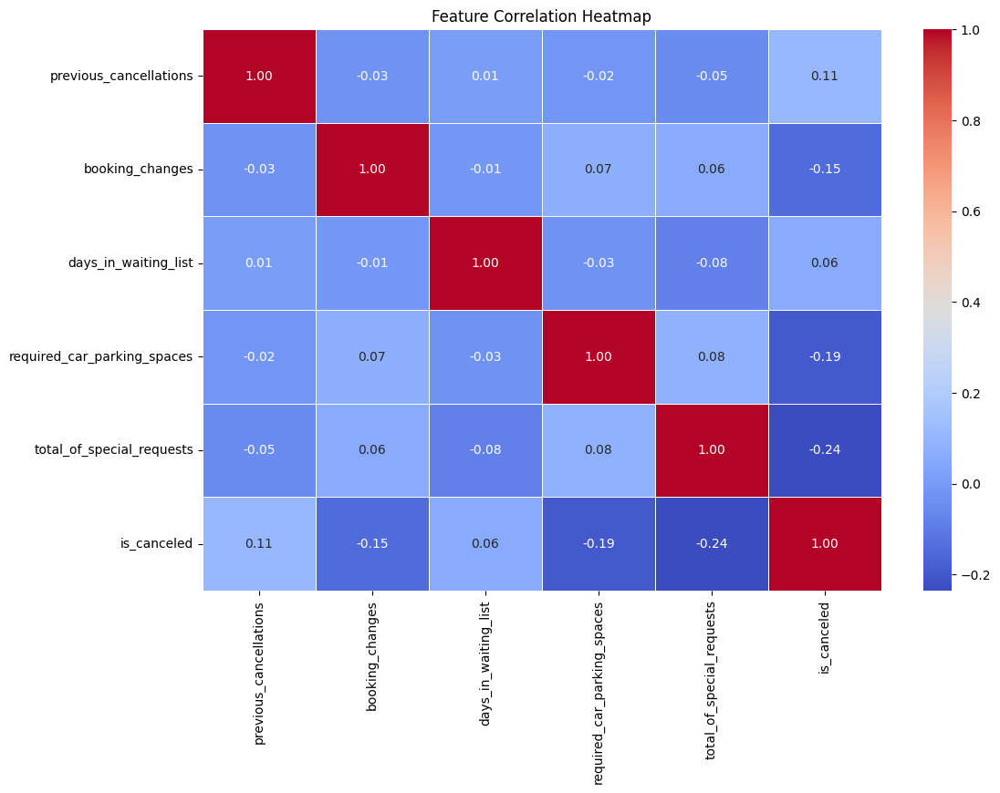

In [15]:
plt.figure(figsize=(12,8))
numeric_df = df.select_dtypes(include=['int64', 'float64'])
corr_matrix = numeric_df.corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()


### Feature Correlation Heatmap
Grafik di atas menunjukkan **korelasi antar fitur numerik** dalam dataset pemesanan hotel.

#### Observasi Utama:
- `previous_cancellations` dan `is_canceled` (0.11):
  - Korelasi positif lemah. Pelanggan dengan riwayat pembatalan sebelumnya cenderung lebih mungkin membatalkan pemesanan.

- `total_of_special_requests` dan `is_canceled` (-0.24):
  - Korelasi negatif terkuat. Semakin banyak permintaan khusus, semakin kecil kemungkinan pembatalan.

- `required_car_parking_spaces` dan `is_canceled` (-0.19):
  - Korelasi negatif lemah. Pelanggan yang memesan tempat parkir cenderung lebih pasti datang.

- `booking_changes` dan `is_canceled` (-0.15):
  - Korelasi negatif lemah. Pelanggan yang sering mengubah pemesanan cenderung tidak membatalkan.

- `days_in_waiting_list` dan `is_canceled` (0.06):
  - Korelasi sangat lemah dan tidak signifikan.

#### Kesimpulan:
- **`total_of_special_requests`** dan **`previous_cancellations`** merupakan kandidat kuat sebagai prediktor dalam model.
- Tidak ada korelasi kuat antar fitur numerik, sehingga **multikolinearitas tidak menjadi masalah**.
- Semua fitur dapat digunakan secara independen dalam model prediksi.



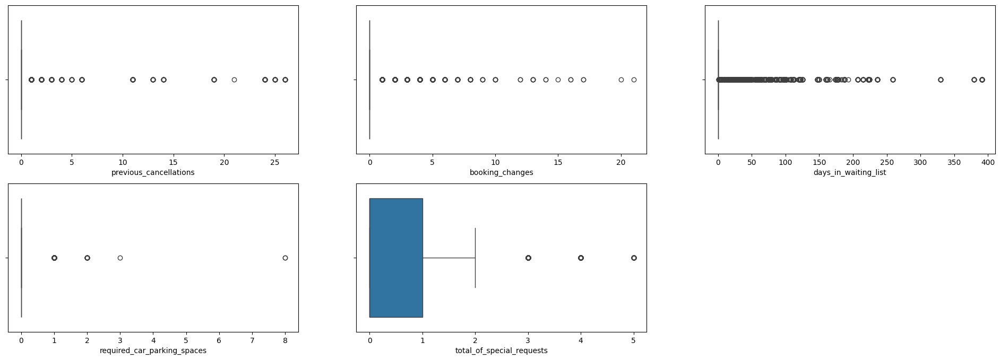

In [16]:
fig, axes = plt.subplots(2, 3, figsize=(24,8))

for i, j in zip(numerical_features, axes.flatten()):
    sns.boxplot(data=df, x= i, ax= j)

plt.gca().axis('off')

plt.show()

### Alasan Tidak Menghilangkan Outlier
Dalam analisis ini, **outlier tidak akan dihilangkan** karena beberapa alasan:

1. **Informasi Penting untuk Prediksi:**
   - Outlier pada fitur seperti `previous_cancellations` dan `days_in_waiting_list` dapat menunjukkan pola perilaku pelanggan yang spesifik, misalnya:
     - Pelanggan yang sering membatalkan pemesanan cenderung melakukan hal yang sama di masa depan.
     - Pemesanan dengan waktu tunggu lama mungkin lebih rentan dibatalkan.
   - Menghilangkan outlier dapat menghilangkan informasi penting yang berguna untuk model prediksi.

2. **Outlier Mewakili Kasus Nyata:**
   - Outlier dalam dataset ini merupakan **kasus nyata** yang terjadi dalam pemesanan hotel, bukan kesalahan pengukuran.
   - Misalnya, pelanggan yang memesan 5 tempat parkir mungkin mewakili kelompok tertentu (rombongan atau keluarga besar).

3. **Model Tree-Based Lebih Tahan terhadap Outlier:**
   - Model seperti **Random Forest** dan **XGBoost** tidak terlalu terpengaruh oleh outlier karena mereka menggunakan pembagian data secara biner.
   - Menggunakan model tree-based akan membantu memanfaatkan informasi outlier secara efektif.

4. **Distribusi Asli Tetap Terjaga:**
   - Dengan mempertahankan outlier, distribusi asli data tetap terjaga, yang dapat membantu model mengenali pola yang jarang namun signifikan.

#### Kesimpulan:
- Outlier dipertahankan untuk **mempertahankan informasi penting** dan **mewakili variasi data yang sebenarnya**.
- Model yang digunakan nantinya akan dipilih berdasarkan ketahanannya terhadap outlier.


#### Bivariative Analysis Numerical Features

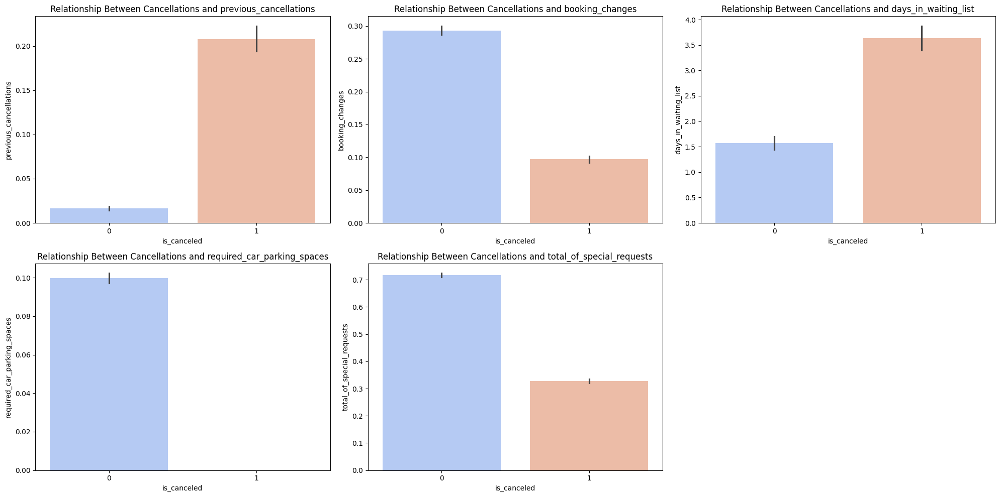

In [17]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

for i, col in enumerate(numerical_features):
    ax = axes[i // 3, i % 3]
    sns.barplot(x=df["is_canceled"], y=df[col], hue=df["is_canceled"], palette="coolwarm", ax=ax, dodge=False, legend=False)
    ax.set_title(f"Relationship Between Cancellations and {col}")

fig.delaxes(axes[1, 2])

plt.tight_layout()
plt.show()


Grafik ini menunjukkan hubungan antara `is_canceled` dan fitur numerik dalam dataset.

#### Observasi Utama:
- `previous_cancellations`:
  - Lebih tinggi pada `is_canceled = 1`.
  - **Insight:** Pelanggan dengan riwayat pembatalan cenderung membatalkan lagi.

- `booking_changes`:
  - Lebih tinggi pada `is_canceled = 0`.
  - **Insight:** Pelanggan yang sering mengubah pemesanan cenderung untuk datang, menunjukkan fleksibilitas namun berkomitmen.

- `days_in_waiting_list`:
  - Lebih tinggi pada `is_canceled = 1`.
  - **Insight:** Lama di daftar tunggu meningkatkan risiko pembatalan.

- `required_car_parking_spaces`:
  - Lebih tinggi pada `is_canceled = 0`.
  - **Insight:** Kebutuhan parkir menunjukkan **komitmen lebih tinggi** untuk datang.

- `total_of_special_requests`:
  - Lebih tinggi pada `is_canceled = 0`.
  - **Insight:** Lebih banyak permintaan khusus = **kemungkinan datang lebih tinggi**.

#### Kesimpulan:
- `previous_cancellations`, `days_in_waiting_list`, dan `total_of_special_requests` adalah **prediktor kuat**.
- **Random Forest** atau **XGBoost** untuk menangkap hubungan non-linear.



#### Bivariative Analysis Categorical Features

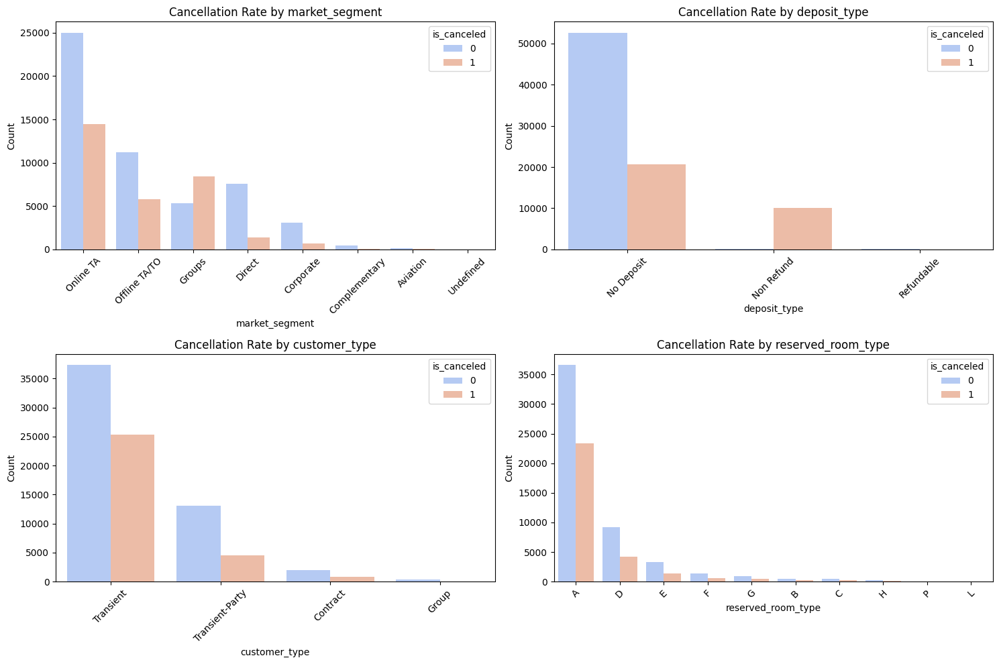

In [18]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for i, col in enumerate(categorical_features):
    ax = axes[i // 2, i % 2]
    sns.countplot(x=df[col], hue=df["is_canceled"], palette="coolwarm", order=df[col].value_counts().index, ax=ax)
    ax.set_title(f"Cancellation Rate by {col}")
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


## Feature Selection and Feature Engineering



### Feature Engineering
#### Alasan Menggunakan OneHotEncoder

OneHotEncoder digunakan untuk mengonversi fitur kategorikal menjadi bentuk numerik biner agar dapat digunakan dalam model machine learning.
Dalam dataset ini, terdapat beberapa kolom kategorikal seperti `market_segment`, `deposit_type`, dan `customer_type`.
Model machine learning umumnya tidak dapat memahami data dalam bentuk teks, sehingga diperlukan proses encoding.

**Mengapa Menggunakan OneHotEncoder?**
- OneHotEncoder mengubah setiap kategori unik menjadi kolom biner (0 atau 1).
- Cara ini **menghindari masalah urutan** yang mungkin muncul jika menggunakan Label Encoding.
  - Contoh: `market_segment` memiliki kategori seperti `Online TA`, `Direct`, `Groups`.
    - Jika menggunakan Label Encoding, kategori ini akan menjadi 0, 1, dan 2 yang secara numerik memberi kesan bahwa `Groups` lebih besar dari `Direct`, padahal tidak demikian.
    - OneHotEncoder mengubahnya menjadi kolom terpisah seperti: `Online_TA`, `Direct`, dan `Groups` dengan nilai 0 atau 1, sehingga tidak ada urutan yang salah.

- Menggunakan `drop='first'` untuk **menghindari multikolinearitas**, yaitu ketika informasi kategori bisa didapatkan dari kombinasi kategori lainnya.
  - Contoh: Jika ada tiga kategori (`A`, `B`, `C`), maka cukup dua kolom (`A` dan `B`) karena jika keduanya bernilai 0, artinya pasti `C`.

- OneHotEncoder cocok digunakan ketika:
  - Fitur kategorikal **tidak memiliki urutan** (nominal).
  - Jumlah kategori relatif **sedikit**, sehingga tidak terlalu banyak menambah jumlah kolom.

Dengan menggunakan OneHotEncoder, data kategorikal dapat diubah menjadi bentuk numerik tanpa memberikan makna urutan atau hubungan antar kategori.
Ini membuat model machine learning dapat **menginterpretasikan data secara akurat** dan **menghindari kesalahan logika**.



In [19]:
categorical_features = df.select_dtypes(include=['object']).columns.tolist()
encoder = OneHotEncoder(drop='first', sparse_output=False)
encoded_features = encoder.fit_transform(df[categorical_features])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_features))
encoded_df


,country_Portugal,market_segment_Complementary,market_segment_Corporate,market_segment_Direct,market_segment_Groups,market_segment_Offline TA/TO,market_segment_Online TA,market_segment_Undefined,deposit_type_Non Refund,deposit_type_Refundable,...,customer_type_Transient-Party,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83568,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
83569,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
83570,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
83571,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
# Drop original categorical columns and concatenate encoded features
df = pd.concat([df, encoded_df], axis=1)
df = df.drop(columns=categorical_features).reset_index(drop=True)
df


,previous_cancellations,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,is_canceled,country_Portugal,market_segment_Complementary,market_segment_Corporate,market_segment_Direct,...,customer_type_Transient-Party,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P
0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,0,0,0,2,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,0,0,2,0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,0,0,0,1,1,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,2,0,0,2,0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83568,0,0,0,0,3,1,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
83569,0,0,0,0,2,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
83570,0,1,0,0,3,0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
83571,0,0,0,0,0,0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Feature Selection
Pada tahap Feature Selection, kita perlu memilih fitur (kolom) yang paling relevan dan memiliki pengaruh kuat terhadap target variabel.
Proses ini bertujuan untuk meningkatkan akurasi dan efisiensi model dengan menghilangkan fitur yang kurang informatif.

Dalam kasus ini, kita memilih `is_canceled` sebagai target variabel, karena kita ingin memprediksi apakah pemesanan akan dibatalkan atau tidak.
Nilai 1 pada `is_canceled` menunjukkan bahwa pemesanan dibatalkan, sedangkan nilai 0 menunjukkan bahwa pemesanan tidak dibatalkan.

Semua kolom lainnya digunakan sebagai fitur input (X) karena berdasarkan analisis sebelumnya, kolom-kolom ini menunjukkan hubungan dengan target variabel.

Dengan melakukan Feature Selection yang tepat, kita dapat meningkatkan performa model dan mengurangi overfitting.

In [21]:
print("Defining features and target variable...")
X = df.drop(['is_canceled'], axis=1)
y = df['is_canceled']
print("Feature matrix (X) shape:", X.shape)
print("Target variable (y) shape:", y.shape)

display(X.head())
display(y.head())

Defining features and target variable...
Feature matrix (X) shape: (83573, 27)
Target variable (y) shape: (83573,)


,previous_cancellations,booking_changes,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests,country_Portugal,market_segment_Complementary,market_segment_Corporate,market_segment_Direct,market_segment_Groups,...,customer_type_Transient-Party,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,reserved_room_type_P
0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,0,0,0,2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,1,0,0,2,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,0,0,0,1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,2,0,0,2,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


0    0
1    0
2    0
3    1
4    0
Name: is_canceled, dtype: int64

## Modeling



Pada tahap ini, kita akan membangun model machine learning untuk memprediksi kemungkinan pembatalan pemesanan hotel (`is_canceled`).
Tujuan utama dari modeling ini adalah untuk **membandingkan performa beberapa algoritma klasifikasi** dan memilih model yang memberikan hasil paling akurat.

### Model Klasifikasi yang Akan Dibandingkan:
1. **Logistic Regression:**
   - Merupakan model klasifikasi yang sederhana dan interpretatif.
   - Digunakan sebagai baseline untuk membandingkan performa model lainnya.

2. **Random Forest:**
   - Model berbasis tree ensemble yang kuat dalam menangani data non-linear dan outlier.
   - Cocok untuk dataset ini yang memiliki fitur numerik dan kategorikal hasil dari OneHotEncoder.

3. **XGBoost:**
   - Model boosting yang sangat populer dan sering digunakan dalam kompetisi data science.
   - Memiliki kemampuan generalisasi yang baik dan dapat menangani **class imbalance** dengan baik.

4. **K-Nearest Neighbors (KNN):**
   - Model berbasis instance yang mengklasifikasikan data berdasarkan kedekatan dengan data lain di sekitarnya.
   - Berguna untuk mendeteksi pola lokal dalam data, namun sensitif terhadap scaling data.

### Alasan Memilih Model Ini:
- Model-model ini dipilih untuk **membandingkan pendekatan yang berbeda**:
  - **Logistic Regression**: Pendekatan linear yang sederhana dan interpretatif.
  - **Random Forest dan XGBoost**: Pendekatan tree-based yang kuat dalam menangani non-linearitas.
  - **KNN**: Pendekatan instance-based yang mempertimbangkan kedekatan data.
- Dengan membandingkan model-model ini, kita dapat **memilih model dengan performa terbaik** berdasarkan evaluasi metrik yang sesuai.

### Evaluasi Model:
- **Accuracy**: Untuk melihat proporsi prediksi yang benar.
- **Recall**: Untuk mengevaluasi kemampuan model dalam mendeteksi pembatalan (kelas 1).
- **Precision**: Untuk mengevaluasi akurasi dari prediksi pembatalan.
- **F1 Score**: Untuk menyeimbangkan Precision dan Recall.
- **ROC AUC**: Untuk mengevaluasi performa model pada berbagai threshold.

Tahap ini akan meliputi:
- Training dan evaluasi pada setiap model.
- **Hyperparameter Tuning** pada model dengan performa terbaik.
- Membuat **confusion matrix** dan **classification report** untuk melihat performa secara mendalam.

Dengan pendekatan ini, kita diharapkan dapat **memilih model yang paling akurat dan andal** dalam memprediksi pembatalan pemesanan hotel.



#### Train Test Split

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

#### Applying StandardScaler on numerical features

StandardScaler digunakan untuk **menstandarisasi skala data numerik** sehingga memiliki:
- **Mean = 0** dan **Standard Deviation = 1**.
- Tujuannya agar semua fitur berada pada skala yang sama dan **tidak mendominasi** model.


In [23]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### Logistic Regression

Logistic Regression adalah model **klasifikasi** yang digunakan untuk memprediksi kemungkinan terjadinya suatu kejadian dalam bentuk **probabilitas**.
Meskipun namanya "regression", model ini digunakan untuk **klasifikasi biner** (contoh: `is_canceled` = 0 atau 1).

### Bagaimana Cara Kerjanya?
- Logistic Regression menghitung **linear combination** dari fitur input (X) menggunakan persamaan:
    \[
    z = w_0 + w_1 X_1 + w_2 X_2 + ... + w_n X_n
    \]
  Di mana:
  - `w` = koefisien (bobot) fitur
  - `X` = fitur input
  - `w_0` = bias (intercept)

- Nilai `z` kemudian dimasukkan ke dalam **Sigmoid Function** untuk mendapatkan probabilitas (antara 0 dan 1):
    \[
    P(y=1) = \frac{1}{1 + e^{-z}}
    \]
  - Hasilnya adalah **probabilitas** dari kelas 1 (contoh: `is_canceled` = 1).
  - Jika probabilitas ≥ 0.5, model akan memprediksi kelas **1**, sebaliknya memprediksi kelas **0**.


In [24]:
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train_scaled, y_train)
y_pred_log = log_reg.predict(X_test_scaled)
acc_log = accuracy_score(y_test, y_pred_log)
roc_auc_log = roc_auc_score(y_test, log_reg.predict_proba(X_test_scaled)[:, 1])
f1_score_log = f1_score(y_test, y_pred_log)
precision_score_log = precision_score(y_test, y_pred_log)
recall_score_log = recall_score(y_test, y_pred_log)

print("Logistic Regression")
print("Accuracy:", acc_log)
print("ROC AUC:", roc_auc_log)
print("F1 Score:", f1_score_log)
print("Precision Score:", precision_score_log)
print("Recall Score:", recall_score_log)
print(classification_report(y_test, y_pred_log))
print("-" * 50)

Logistic Regression
Accuracy: 0.7781190172303765
ROC AUC: 0.8590853428617011
F1 Score: 0.6406562883534656
Precision Score: 0.7936939820742638
Recall Score: 0.5370952019928518
              precision    recall  f1-score   support

           0       0.77      0.92      0.84     15839
           1       0.79      0.54      0.64      9233

    accuracy                           0.78     25072
   macro avg       0.78      0.73      0.74     25072
weighted avg       0.78      0.78      0.77     25072

--------------------------------------------------


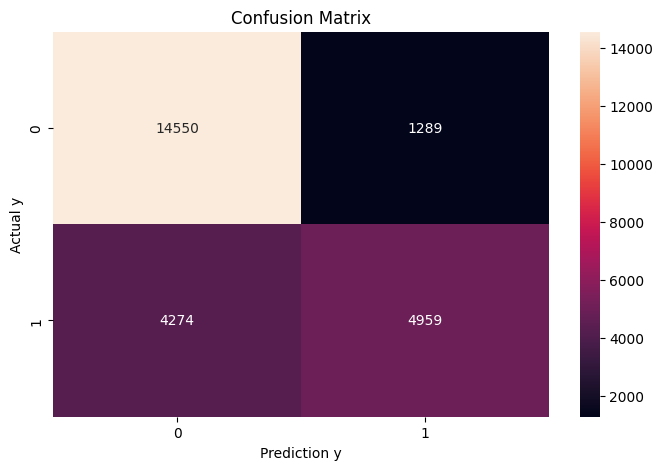

In [25]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_log)
sns.heatmap(cf_matrix, annot=True, fmt='0.0f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

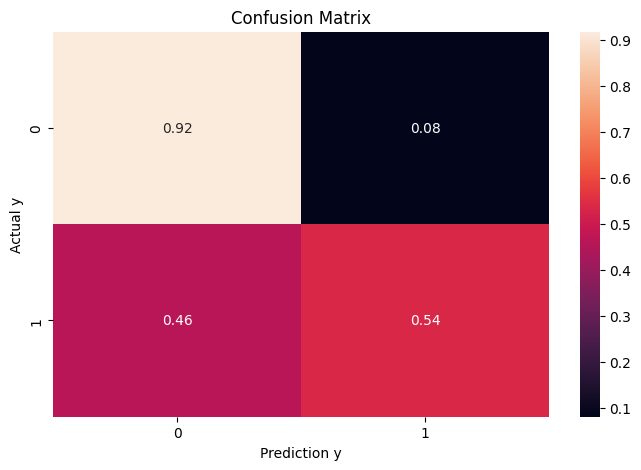

In [26]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_log, normalize='true')
sns.heatmap(cf_matrix, annot=True, fmt='0.2f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

#### Random Forest

In [27]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)
acc_rf = accuracy_score(y_test, y_pred_rf)
roc_auc_rf = roc_auc_score(y_test, rf.predict_proba(X_test_scaled)[:, 1])
f1_score_rf = f1_score(y_test, y_pred_rf)
precision_score_rf = precision_score(y_test, y_pred_rf)
recall_score_rf = recall_score(y_test, y_pred_rf)

print("Random Forest")
print("Accuracy:", acc_rf)
print("ROC AUC:", roc_auc_rf)
print("F1 Score:", f1_score_rf)
print("Precision Score:", precision_score_rf)
print("Recall Score:", recall_score_rf)
print(classification_report(y_test, y_pred_rf))
print("-" * 50)

Random Forest
Accuracy: 0.8101866624122527
ROC AUC: 0.8867151733762116
F1 Score: 0.7324149564239528
Precision Score: 0.7615762394761459
Recall Score: 0.7054045272392505
              precision    recall  f1-score   support

           0       0.84      0.87      0.85     15839
           1       0.76      0.71      0.73      9233

    accuracy                           0.81     25072
   macro avg       0.80      0.79      0.79     25072
weighted avg       0.81      0.81      0.81     25072

--------------------------------------------------


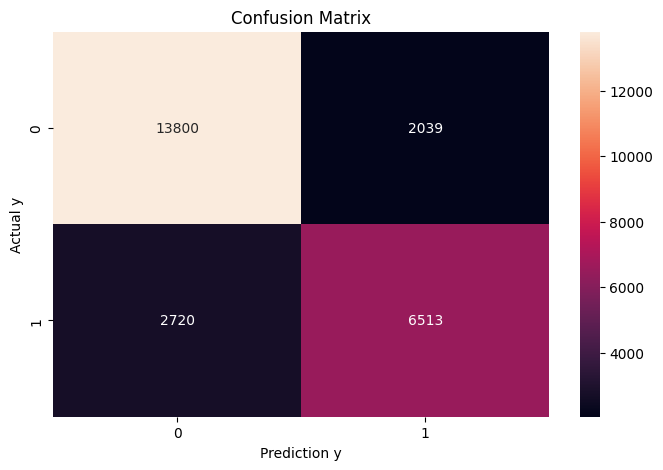

In [28]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_rf)
sns.heatmap(cf_matrix, annot=True, fmt='0.0f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

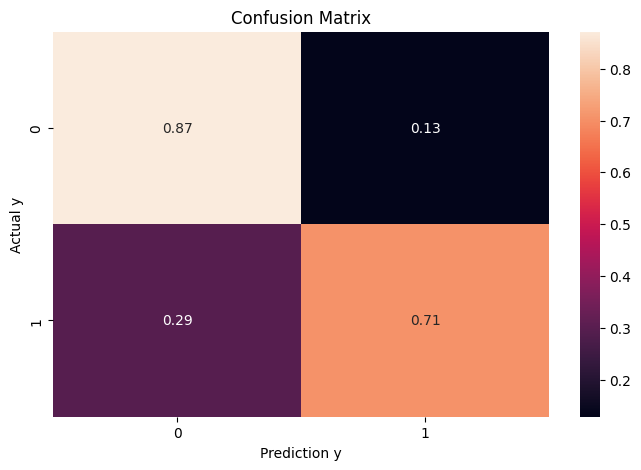

In [29]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_rf, normalize='true')
sns.heatmap(cf_matrix, annot=True, fmt='0.2f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

#### XGBoost

In [30]:
xgb_model = xgb.XGBClassifier(random_state=42, eval_metric='logloss')
xgb_model.fit(X_train_scaled, y_train)
y_pred_xgb = xgb_model.predict(X_test_scaled)
acc_xgb = accuracy_score(y_test, y_pred_xgb)
roc_auc_xgb = roc_auc_score(y_test, xgb_model.predict_proba(X_test_scaled)[:, 1])
f1_score_xgb = f1_score(y_test, y_pred_xgb)
precision_score_xgb = precision_score(y_test, y_pred_xgb)
recall_score_xgb = recall_score(y_test, y_pred_xgb)


print("XGBoost")
print("Accuracy:", acc_xgb)
print("ROC AUC:", roc_auc_xgb)
print("F1 Score:", f1_score_xgb)
print("Precision Score:", precision_score_xgb)
print("Recall Score:", recall_score_xgb)
print(classification_report(y_test, y_pred_xgb))
print("-" * 50)


XGBoost
Accuracy: 0.8112236758136566
ROC AUC: 0.8883776291197039
F1 Score: 0.7289698219091794
Precision Score: 0.7733900364520049
Recall Score: 0.6893750676919744
              precision    recall  f1-score   support

           0       0.83      0.88      0.86     15839
           1       0.77      0.69      0.73      9233

    accuracy                           0.81     25072
   macro avg       0.80      0.79      0.79     25072
weighted avg       0.81      0.81      0.81     25072

--------------------------------------------------


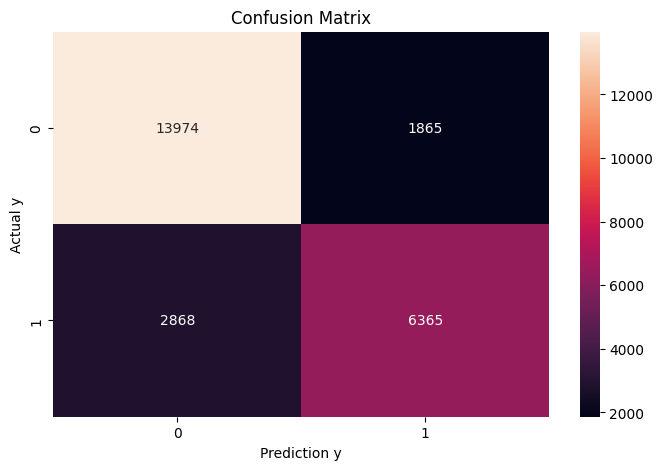

In [31]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_xgb)
sns.heatmap(cf_matrix, annot=True, fmt='0.0f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

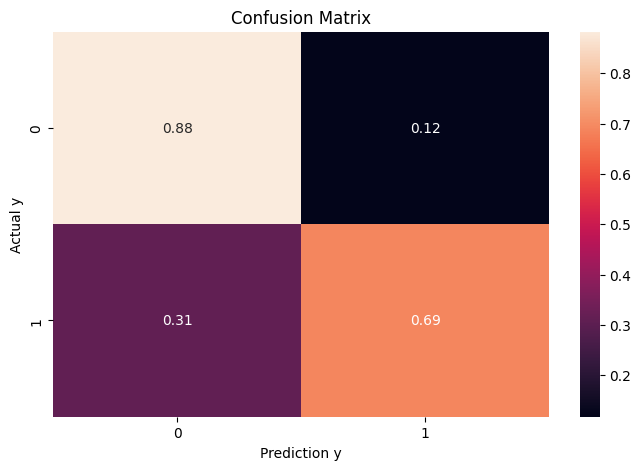

In [32]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_xgb, normalize='true')
sns.heatmap(cf_matrix, annot=True, fmt='0.2f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

#### KNN

In [33]:
knn = KNeighborsClassifier()
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)
acc_knn = accuracy_score(y_test, y_pred_knn)
roc_auc_knn = roc_auc_score(y_test, knn.predict_proba(X_test_scaled)[:, 1])
f1_score_knn = f1_score(y_test, y_pred_knn)
precision_score_knn = precision_score(y_test, y_pred_knn)
recall_score_knn = recall_score(y_test, y_pred_knn)

print("K-Nearest Neighbors")
print("Accuracy:", acc_knn)
print("ROC AUC:", roc_auc_knn)
print("F1 Score:", f1_score_knn)
print("Precision Score:", precision_score_knn)
print("Recall Score:", recall_score_knn)
print(classification_report(y_test, y_pred_knn))
print("-" * 50)

K-Nearest Neighbors
Accuracy: 0.7741703892788768
ROC AUC: 0.8497425562966274
F1 Score: 0.6458150882021769
Precision Score: 0.7644010069598697
Recall Score: 0.5590815552908047
              precision    recall  f1-score   support

           0       0.78      0.90      0.83     15839
           1       0.76      0.56      0.65      9233

    accuracy                           0.77     25072
   macro avg       0.77      0.73      0.74     25072
weighted avg       0.77      0.77      0.76     25072

--------------------------------------------------


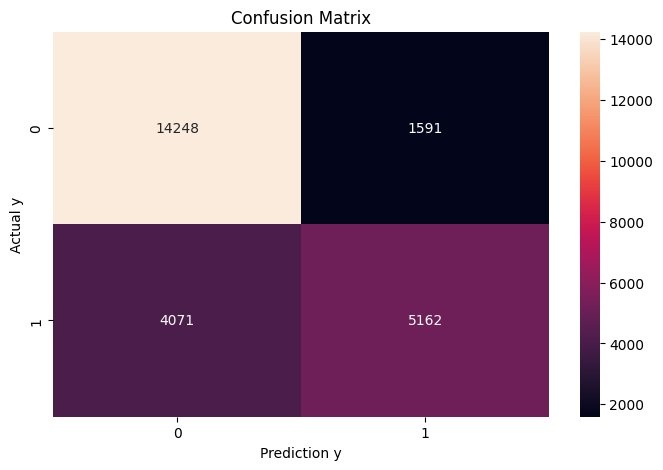

In [34]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_knn)
sns.heatmap(cf_matrix, annot=True, fmt='0.0f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

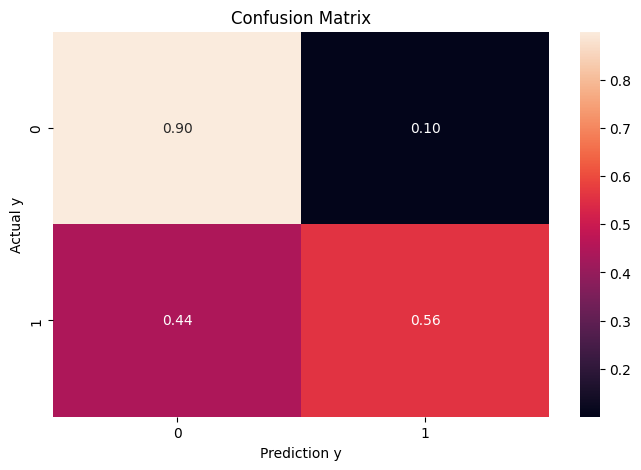

In [35]:
plt.figure(figsize=(8,5))
cf_matrix = confusion_matrix(y_test, y_pred_knn, normalize='true')
sns.heatmap(cf_matrix, annot=True, fmt='0.2f', cmap='rocket')
plt.xlabel('Prediction y')
plt.ylabel('Actual y')
plt.title('Confusion Matrix')

plt.show()

## Kesimpulan Pemilihan Model Machine Learning

Setelah membandingkan empat model klasifikasi: 
- Logistic Regression
- XGBoost
- Random Forest
- K-Nearest Neighbors (KNN)

Berdasarkan hasil evaluasi, **XGBoost menunjukkan kinerja terbaik di semua metrik**:
- **Accuracy = 81.12%** (tertinggi di antara semua model)
- **ROC AUC = 0.888** (kemampuan terbaik dalam membedakan kelas)
- **F1 Score = 0.729** (harmoni terbaik antara Precision dan Recall)
- **Precision = 0.773** (tingkat False Positive yang rendah)
- **Recall = 0.689** (deteksi pembatalan yang lebih baik)

---

### Model yang Dipilih: XGBoost
- **Mengapa Memilih XGBoost?**
  - **Performa Terbaik di Semua Metrik**: Secara konsisten memiliki nilai tertinggi pada **Accuracy, ROC AUC, F1 Score, Precision, dan Recall**.
  - **Kemampuan Generalisasi yang Baik**: Dengan **ROC AUC yang tinggi (0.888)**, model ini **mampu membedakan kelas secara efektif**.
  - **Recall yang Lebih Tinggi**: Recall yang lebih tinggi (0.689) berarti model **lebih baik dalam mendeteksi pembatalan**, sehingga **mengurangi risiko kekosongan kamar yang tidak terduga**.
  - **Stabil dan Andal**: XGBoost dikenal dengan **stabilitas dan kemampuan generalisasi yang kuat** pada berbagai dataset.



## Hyperparameter Tuning

Setelah memilih XGBoost sebagai model terbaik berdasarkan evaluasi kinerja pada metrik Accuracy, ROC AUC, F1 Score, Precision, dan Recall langkah selanjutnya adalah mengoptimalkan performa model melalui Hyperparameter Tuning

Hyperparameter Tuning bertujuan untuk:
- Mencari kombinasi parameter terbaik yang dapat meningkatkan akurasi dan kemampuan generalisasi model
- Mengoptimalkan trade-off antara Precision dan Recall terutama untuk mendeteksi pembatalan dengan lebih akurat
- Mencegah overfitting dengan menemukan nilai parameter yang tepat

Pada tahap ini, kita akan menggunakan RandomizedSearchCV untuk:
- Menjelajahi ruang hyperparameter yang luas dengan efisien.
- Memilih kombinasi parameter terbaik berdasarkan kinerja model pada data validasi


In [36]:
# 1. Definisikan parameter yang akan dituning
param_distributions = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [3, 5, 7, 9],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.5],
    'reg_alpha': [0, 0.1, 0.5, 1],
    'reg_lambda': [1, 2, 5, 10]
}

# 2. Inisialisasi model XGBoost
xgb_model = xgb.XGBClassifier(
    eval_metric='logloss',
    random_state=42
)

# 3. Gunakan RandomizedSearchCV untuk tuning
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_distributions,
    scoring='roc_auc',  # Bisa diganti menjadi 'accuracy' atau metrik lain
    n_iter=50,          # Banyaknya iterasi random (semakin banyak, semakin komprehensif)
    cv=5,               # 3-fold cross-validation
    verbose=1,          # Tampilkan proses
    random_state=42,    # Supaya hasil bisa direproduksi
    n_jobs=-1           # Gunakan seluruh core CPU
)

# 4. Fit model pada data training (X_train_scaled, y_train)
random_search.fit(X_train_scaled, y_train)

# Tampilkan kombinasi parameter terbaik
print("Best Parameters:", random_search.best_params_)
print("Best ROC AUC Score during CV:", random_search.best_score_)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 400, 'max_depth': 9, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.8}
Best ROC AUC Score during CV: 0.8894769842361929


%% [markdown]
## Hyperparameter Tuning dengan RandomizedSearchCV

Pada tahap ini, dilakukan **Hyperparameter Tuning** pada **XGBoost** menggunakan **RandomizedSearchCV**. 
Tujuan dari langkah ini adalah untuk **menemukan kombinasi parameter terbaik** yang dapat **meningkatkan performa model** dalam **memprediksi pembatalan booking**.

---

### Apa yang Dilakukan?
- **RandomizedSearchCV** digunakan untuk **menguji berbagai kombinasi hyperparameter** secara acak dalam ruang parameter yang ditentukan.
- **ROC AUC digunakan sebagai metrik evaluasi utama**, karena fokusnya adalah pada **kemampuan model dalam membedakan kelas yang dibatalkan dan tidak dibatalkan**.
- **Cross-validation dengan 5-fold** digunakan untuk **memastikan generalisasi model** dan mengurangi risiko overfitting.
- Dilakukan **50 iterasi** untuk mencari kombinasi parameter yang optimal.

---

### Hasil Hyperparameter Tuning:
```
Best Parameters: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0, 
                 'n_estimators': 400, 'max_depth': 9, 'learning_rate': 0.05, 
                 'gamma': 0.1, 'colsample_bytree': 0.8}
Best ROC AUC Score during CV: 0.889
```
- **ROC AUC Score tertinggi selama Cross-Validation adalah 0.889**, yang menunjukkan **kemampuan model yang sangat baik dalam membedakan kelas yang dibatalkan dan tidak dibatalkan**.
- **Parameter terbaik ditemukan dengan kombinasi di atas**, yang akan digunakan pada model final untuk **evaluasi pada data testing**.

---

### Kesimpulan:
- **Hyperparameter Tuning berhasil meningkatkan performa model**, terlihat dari **ROC AUC Score sebesar 0.889**.
- Model dengan parameter terbaik ini **diharapkan mampu memprediksi pembatalan dengan lebih akurat**, sehingga **dapat membantu hotel dalam mengoptimalkan manajemen kamar dan meningkatkan pendapatan**.
- Langkah selanjutnya adalah **menggunakan model dengan parameter terbaik ini pada data testing untuk evaluasi final**.

---


In [37]:
# 5. Gunakan model terbaik untuk evaluasi pada data test
best_xgb = random_search.best_estimator_
y_pred_best = best_xgb.predict(X_test_scaled)

# Hitung metrik evaluasi
accuracy_best = accuracy_score(y_test, y_pred_best)
roc_auc_best = roc_auc_score(y_test, best_xgb.predict_proba(X_test_scaled)[:, 1])
f1_score_best = f1_score(y_test, y_pred_best)
precision_score_best = precision_score(y_test, y_pred_best)
recall_score_best = recall_score(y_test, y_pred_best)

print("Test Accuracy:", accuracy_best)
print("Test ROC AUC:", roc_auc_best)
print("Test F1 Score:", f1_score_best)
print("Test Precision Score:", precision_score_best)
print("Test Recall Score:", recall_score_best)
print("Classification Report:")
print(classification_report(y_test, y_pred_best))

Test Accuracy: 0.8116624122527122
Test ROC AUC: 0.888936844576806
Test F1 Score: 0.7297080709788208
Test Precision Score: 0.773825421876897
Test Recall Score: 0.6903498321239034
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.88      0.86     15839
           1       0.77      0.69      0.73      9233

    accuracy                           0.81     25072
   macro avg       0.80      0.79      0.79     25072
weighted avg       0.81      0.81      0.81     25072



## Evaluasi Hasil Setelah Hyperparameter Tuning

Setelah melakukan **Hyperparameter Tuning** pada model **XGBoost**, didapatkan **peningkatan performa** meskipun hanya sedikit. Berikut adalah perbandingan sebelum dan sesudah tuning:

---

### Sebelum Tuning:
```
Accuracy: 81.12%
ROC AUC: 0.888
F1 Score: 0.729
Precision: 0.773
Recall: 0.689
```

### Setelah Tuning:
```
Accuracy: 81.17% (+0.05%)
ROC AUC: 0.889 (+0.05%)
F1 Score: 0.730 (+0.001)
Precision: 0.774 (+0.0008)
Recall: 0.690 (+0.001)
```

---

### Analisis dan Kesimpulan:
- **Peningkatan performa** terlihat pada **semua metrik** meski **hanya sedikit**.
- **ROC AUC meningkat dari 0.888 menjadi 0.889**, menunjukkan **sedikit perbaikan dalam kemampuan model membedakan kelas**.
- **F1 Score, Precision, dan Recall juga meningkat**, yang menunjukkan **peningkatan kemampuan model dalam mendeteksi pembatalan**.
- Meskipun perbedaannya kecil, **hyperparameter tuning tetap efektif dalam mengoptimalkan performa model**.

---

### Implikasi:
- **Model yang sudah dituning** dapat digunakan untuk **prediksi pembatalan yang lebih akurat**.
- Dengan **ROC AUC yang lebih tinggi**, model ini **lebih andal dalam mengklasifikasikan pembatalan dan tidak pembatalan**.
- **Informasi ini dapat membantu hotel dalam pengambilan keputusan operasional dan strategi marketing**.

---

## Nilai Aktual vs Nilai Prediksi

In [38]:
# Membuat DataFrame Perbandingan
comparison_df = pd.DataFrame({
    'Actual': y_test.values,
    'Predicted': y_pred_best
})

# Menampilkan Sample Data
display(comparison_df.head(10))


,Actual,Predicted
0,0,0
1,0,0
2,0,1
3,1,0
4,1,0
5,0,0
6,0,0
7,1,1
8,0,0
9,0,0


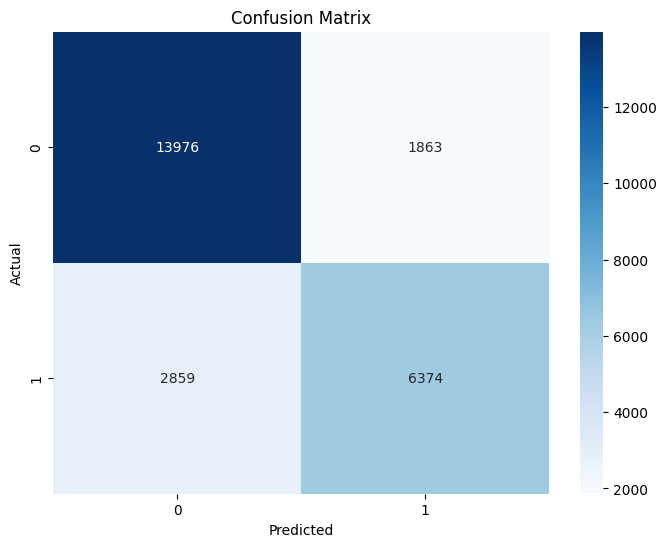

In [39]:
# Membuat Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_best)

# Visualisasi Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Confusion Matrix Analysis

Confusion Matrix ini menunjukkan performa model XGBoost setelah dilakukan Hyperparameter Tuning. Berikut adalah interpretasinya:

- **True Negative (TN) = 13,976**  
  Model berhasil memprediksi **13,976** booking **tidak dibatalkan** dengan benar (0 diprediksi sebagai 0).

- **False Positive (FP) = 1,863**  
  Model salah memprediksi **1,863** booking sebagai **dibatalkan** padahal sebenarnya **tidak dibatalkan** (0 diprediksi sebagai 1). 

- **False Negative (FN) = 2,859**  
  Model salah memprediksi **2,859** booking sebagai **tidak dibatalkan** padahal sebenarnya **dibatalkan** (1 diprediksi sebagai 0). 

- **True Positive (TP) = 6,374**  
  Model berhasil memprediksi **6,374** booking **dibatalkan** dengan benar (1 diprediksi sebagai 1).

### Kesimpulan:
- **Model cukup baik dalam mengidentifikasi booking yang tidak dibatalkan**, terlihat dari **tingginya TN**.
- **Namun, masih terdapat kesalahan dalam memprediksi booking yang dibatalkan**, yaitu **FN** yang cukup tinggi.
- **Performa model setelah hyperparameter tuning menunjukkan hasil yang lebih baik dibandingkan sebelumnya**, meskipun perbaikan metrik hanya sedikit. 

Confusion Matrix ini memberikan gambaran menyeluruh tentang **kemampuan model dalam memisahkan dua kelas (0 dan 1)**, serta membantu dalam **mengevaluasi trade-off antara precision dan recall**.


## Interpretabilitas Model dengan SHAP

Setelah memperoleh model dengan performa yang baik, langkah selanjutnya adalah **memahami bagaimana model membuat prediksi**. 
Ini penting untuk:
- **Membangun kepercayaan stakeholder** terhadap model.
- **Mengidentifikasi fitur-fitur penting** yang memengaruhi keputusan model.
- **Mengoptimalkan strategi bisnis** berdasarkan **wawasan dari model**.

---

### Mengapa Menggunakan SHAP?
- **SHAP (SHapley Additive exPlanations)** adalah **metode interpretasi model yang konsisten dan akurat**.
- Berdasarkan **teori nilai Shapley dari teori permainan**, SHAP **menghitung kontribusi setiap fitur untuk setiap prediksi**.
- **Lebih informatif dibandingkan feature importance biasa** karena menunjukkan:
  - **Arah pengaruh fitur** (positif atau negatif terhadap prediksi).
  - **Besaran pengaruh fitur** pada prediksi spesifik.
  - **Interaksi antar fitur** (dengan SHAP dependence plot).


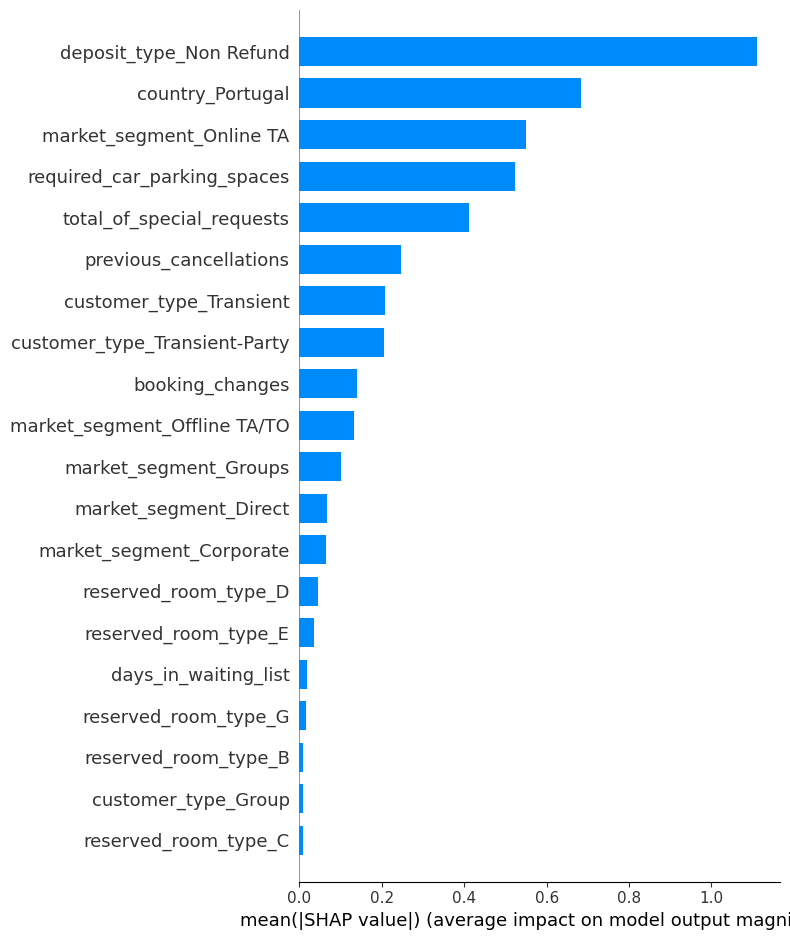

In [40]:
explainer = shap.TreeExplainer(best_xgb)
shap_values = explainer.shap_values(X_test_scaled)
shap.summary_plot(shap_values, X_test, plot_type="bar")


### Hasil Summary Plot:
- **Deposit Type - Non Refund** adalah **fitur paling berpengaruh** dalam menentukan pembatalan, menunjukkan **pelanggan yang tidak mendapat refund lebih cenderung membatalkan**.
- **Country - Portugal** juga **berpengaruh signifikan**, menunjukkan **asal negara memengaruhi keputusan pembatalan**.
- **Market Segment - Online TA** dan **Required Car Parking Spaces** menunjukkan **preferensi pelanggan** yang memengaruhi pembatalan.
- **Fitur-fitur seperti Total of Special Requests dan Previous Cancellations** menunjukkan **kebiasaan dan perilaku pelanggan** dalam memesan.
- **Fitur lainnya** memiliki pengaruh yang lebih kecil, namun tetap memberikan **kontribusi dalam keputusan model**.


## Save Model

Langkah selanjutnya adalah menyimpan model dengan menggunakan pickle, disini format penyimpanannya bisa dengan .pkl atau dengan .sav, utamanya menggunakan .pkl

In [41]:

# --- Simpan model ke file pickle ---
with open('hotel_best_xgb_model.pkl', 'wb') as file:
    pickle.dump(best_xgb, file)
print("Model berhasil disimpan ke 'hotel_best_xgb_model.pkl'.")

Model berhasil disimpan ke 'hotel_best_xgb_model.pkl'.


In [42]:
# --- Simpan model ke file pickle ---
with open('hotel_best_xgb_model.sav', 'wb') as file:
    pickle.dump(best_xgb, file)
print("Model berhasil disimpan ke 'hotel_best_xgb_model.sav'.")

Model berhasil disimpan ke 'hotel_best_xgb_model.sav'.


## Kesimpulan

### 1. Penyelesaian Masalah Bisnis
Model yang dikembangkan berhasil menyelesaikan masalah bisnis yang didefinisikan di awal, yaitu memprediksi pembatalan booking hotel. Dengan prediksi yang lebih akurat, pihak hotel dapat mengoptimalkan inventaris kamar, meminimalkan kehilangan pendapatan, dan meningkatkan kepuasan pelanggan melalui perencanaan yang lebih efektif.

### 2. Pencapaian yang Terukur
- Setelah dilakukan Hyperparameter Tuning, model XGBoost menunjukkan performa yang lebih baik dengan metrik:
  - Accuracy: 81.16%
  - ROC AUC: 88.89%
  - F1 Score: 72.97%
- Peningkatan ini menunjukkan bahwa model memiliki kemampuan yang lebih akurat dalam mengidentifikasi kemungkinan pembatalan, sehingga keputusan bisnis dapat lebih efektif.

### 3. Kapan Model Baik Digunakan
- Model ini baik digunakan ketika akurasi prediksi menjadi prioritas untuk mengoptimalkan pemesanan kamar dan meminimalkan dampak pembatalan.
- Cocok digunakan pada:
  - Peak season atau periode permintaan tinggi, di mana pembatalan dapat berdampak signifikan terhadap pendapatan hotel.
  - Saat merencanakan strategi overbooking untuk memaksimalkan okupansi kamar.

### 4. Kapan Model Kurang Dapat Dipercaya
- Model ini kurang dapat diandalkan pada kondisi:
  - Terjadi perubahan tren pasar atau perilaku pelanggan yang berbeda dari pola historis dalam data training.
  - Kondisi eksternal yang tidak terprediksi, seperti pandemi atau krisis ekonomi global, yang dapat mengubah pola pembatalan secara drastis.
  - Saat terdapat segmen pelanggan baru atau perubahan dalam strategi pemasaran yang belum tercermin dalam data historis.

### 5. Dampak Implementasi pada Proses Bisnis
- **Optimisasi Pendapatan**: Dengan memprediksi pembatalan secara akurat, hotel dapat dengan cepat mengisi kamar yang dibatalkan sehingga mengurangi potensi kerugian pendapatan.
- **Efisiensi Operasional**: Model ini membantu dalam perencanaan sumber daya seperti persiapan kamar dan alokasi staf, sehingga operasional hotel menjadi lebih efisien.
- **Strategi Harga dan Promosi yang Lebih Tepat**: Dengan informasi pelanggan yang memiliki kemungkinan tinggi untuk membatalkan, hotel dapat melakukan strategi harga atau memberikan penawaran khusus untuk mengurangi pembatalan.
- **Peningkatan Kepuasan Pelanggan**: Dengan mengurangi risiko overbooking dan meningkatkan ketersediaan kamar, pengalaman pelanggan dapat lebih ditingkatkan.

### 6. Rekomendasi Bisnis
- **Implementasi Model Machine Learning Secara Menyeluruh**: Menerapkan model prediksi ini pada sistem operasional hotel secara real-time untuk mendukung keputusan bisnis yang lebih akurat.
- **Review Kebijakan Pembatalan Hotel**: Melakukan peninjauan ulang terhadap kebijakan pembatalan dan menerapkan pendekatan yang lebih ketat untuk mengurangi jumlah pembatalan.
- **Menghubungi Pelanggan di Waiting List Secara Proaktif**: Menghubungi pelanggan dalam daftar tunggu segera setelah terjadi pembatalan untuk memastikan kamar tidak kosong.
- **Meningkatkan Efisiensi Operasional**: Memastikan jumlah staf yang memadai dan dilatih dengan baik untuk menghadapi situasi hotel yang selalu penuh.
- **Strategi Overbooking yang Lebih Efektif**: Menggunakan prediksi pembatalan untuk mengatur strategi overbooking secara lebih akurat tanpa merugikan pelanggan.
- **Promosi yang Tepat Sasaran**: Memberikan penawaran khusus kepada pelanggan yang memiliki kemungkinan tinggi untuk membatalkan, sehingga dapat mengurangi tingkat pembatalan.
- **Dynamic Pricing**: Mengoptimalkan harga kamar berdasarkan kemungkinan pembatalan untuk memaksimalkan pendapatan.
- **Pengelolaan Stok Kamar yang Lebih Baik**: Mempersiapkan kamar untuk pelanggan yang diprediksi tidak akan membatalkan sehingga meningkatkan efisiensi okupansi.
- **Strategi Komunikasi yang Lebih Baik**: Mengirimkan pengingat atau penawaran fleksibilitas kepada pelanggan yang diprediksi berpotensi membatalkan untuk mempertahankan reservasi mereka.

### 7. Batasan dan Keterbatasan Model
- **Batasan Data**:
  - Model menggunakan data historis yang mungkin tidak mencerminkan tren masa depan yang dinamis.
  - Data imbalance antara pembatalan dan non-pembatalan dapat mempengaruhi performa model.
- **Batasan Model**:
  - Model tidak mempertimbangkan faktor eksternal seperti event lokal, cuaca, atau tren ekonomi yang dapat mempengaruhi keputusan pelanggan.
  - Model hanya melakukan prediksi tanpa menjelaskan alasan di balik keputusan pelanggan.
- **Batasan Waktu dan Implementasi**:
  - Proses Hyperparameter Tuning memerlukan waktu komputasi yang cukup lama.
  - Implementasi model secara real-time membutuhkan integrasi yang matang dengan sistem reservasi hotel.

### 8. Rekomendasi Pengembangan Selanjutnya
- **Integrasi Data Eksternal**: Menggunakan data eksternal seperti cuaca, event lokal, atau tren perjalanan global untuk meningkatkan akurasi prediksi.
- **Pengembangan Dashboard untuk Decision-Making**: Mengintegrasikan model ke dalam dashboard analitik yang dapat digunakan oleh tim manajemen hotel untuk membuat keputusan strategis secara real-time.
- **Pengembangan Fitur Personalisasi**: Memberikan rekomendasi yang lebih personal kepada pelanggan berdasarkan riwayat perilaku dan prediksi pembatalan.
- **Pengujian Model Secara Real-Time**: Melakukan deployment model ke dalam sistem operasional hotel untuk menguji performa dan akurasi prediksi secara real-time.
- **Evaluasi dan Pembaruan Berkala**: Mengikuti tren terbaru dalam perilaku pelanggan dan memperbarui model secara berkala agar tetap relevan.

Dengan kesimpulan dan rekomendasi ini, solusi yang dihasilkan tidak hanya menjawab permasalahan bisnis yang didefinisikan di awal, tetapi juga memberikan dampak nyata pada optimalisasi pendapatan, efisiensi operasional, dan peningkatan pengalaman pelanggan.
